### METRICS EXPERIMENTATION

In [1]:
import os 
import sys
import argparse
import evolocity as evo
import anndata
import pandas as pd
import numpy as np
import torch
import scanpy as sc


#### Hyperparamters to Change

In [2]:
### v-gene-family level

dataset = "OVA_mouse"
mode = "full_VDJ"
group = "v_gene_family"
include_germline = False
no_IGM = True

### specific v-gene level

dataset_specific = "OVA_mouse"
group_specific = "v_gene"
mode_specific = "v_gene_only"
include_germline_specific = True
unrecombined = True

### Initialization - V-gene family level

In [3]:
import pickle as pkl

subset_level = "v-gene family"

if include_germline:
    file_path = f"../../../data/{dataset}/evo_velo_{group}_germline.pkl"
else:
    file_path = f"../../../data/{dataset}/evo_velo_{group}.pkl"

with open(file_path,"rb") as file:
    model_dict = pkl.load(file)

In [4]:
file_path

'../../../data/OVA_mouse/evo_velo_v_gene_family.pkl'

### Initialization - Specific V-gene level

In [59]:
import pickle as pkl

subset_level = "specific v-gene"

if include_germline_specific and unrecombined == False:
    file_path = f"../../../data/{dataset_specific}/evo_velo_{group_specific}_germline.pkl"
elif include_germline_specific and unrecombined == True:
    file_path = f"../../../data/{dataset_specific}/evo_velo_{group_specific}_unrecombined_germline.pkl"
else:
    file_path = f"../../../data/{dataset_specific}/evo_velo_{group_specific}.pkl"

with open(file_path,"rb") as file:
    model_dict_specific = pkl.load(file)

### Which level to analyse

In [60]:
model_names = ["ablang","sapiens","protbert","ESM"]
data = pd.read_csv(os.path.join("..","..","..","data",dataset,"vdj_evolike_combine.csv"))

if subset_level == "v-gene family":
    current_model = model_dict
    del(model_dict)
else:
    current_model = model_dict_specific
    del(model_dict_specific)

#### IgM-IgG/IgG-IgM velocities

In [61]:
output_table = []

isotype_1 = "IGHM"
isotype_2 = "IGHG"

for model in model_names:
    for sub_group in list(np.sort(np.array(list(current_model[model].keys())))):
   
        metadata = current_model[model][sub_group].obs
        velocity_graph = current_model[model][sub_group].uns["velocity_graph"]
        velocity_graph_neg = current_model[model][sub_group].uns["velocity_graph_neg"] 
        
        isotype_1_indices = list(metadata.loc[metadata["isotype"] ==  isotype_1,:].index.astype(int))
        isotype_2_indices = list(metadata.loc[metadata["isotype"] ==  isotype_2,:].index.astype(int))
        
        velo_sum = 0
        non_zero_velos = 0
        
        for i in isotype_1_indices:
            velo_sum += velocity_graph[i, isotype_2_indices].sum() + velocity_graph_neg[i, isotype_2_indices].sum()
            non_zero_velos += (velocity_graph[i, isotype_2_indices] != 0).sum() + (velocity_graph_neg[i, isotype_2_indices] != 0).sum()
        
        if non_zero_velos > 0:
            velo_avg_1_to_2 = velo_sum/non_zero_velos
        else:
            velo_avg_1_to_2 = 0
        
        velo_sum = 0
        non_zero_velos = 0
        
        for i in isotype_2_indices:
            velo_sum += velocity_graph[i, isotype_1_indices].sum() + velocity_graph_neg[i, isotype_1_indices].sum()
            non_zero_velos += (velocity_graph[i,isotype_1_indices] != 0).sum() + (velocity_graph_neg[i, isotype_1_indices] != 0).sum()
            
        if non_zero_velos > 0:
            velo_avg_2_to_1 = velo_sum/non_zero_velos
        else:
            velo_avg_2_to_1 = 0

        velo_max = max(velocity_graph.max(),-velocity_graph_neg.min())
        output_table.append({"model":model,f"{group}":sub_group, f"Avg_{isotype_1}_to_{isotype_2}":velo_avg_1_to_2, 
                             f"Avg_{isotype_2}_to_{isotype_1}":velo_avg_2_to_1, })
        
output_table = pd.DataFrame(output_table)

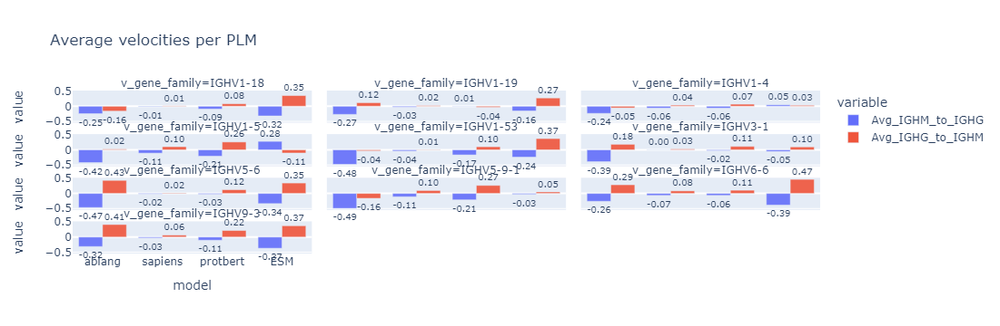

In [62]:
import plotly.express as px

fig = px.bar(
    data_frame = output_table,
    facet_col = "v_gene_family",
    facet_col_wrap = 3,
    x = "model",
    y = [f"Avg_{isotype_1}_to_{isotype_2}",f"Avg_{isotype_2}_to_{isotype_1}"],
    opacity = 0.9,
    orientation = "v",
    barmode = 'group',
    title='Average velocities per PLM',
    text_auto="0.2f"
)

fig.update_layout(height = 2000)
fig.update_traces(textfont_size=10, textangle=0, textposition="outside", cliponaxis=False)

fig.show()

#### In/Out Degree Difference Per Isotype

In [63]:
from scipy.sparse import coo_matrix

output_table = []

model = "ESM"

for model in model_names:
    for sub_group in list(np.sort(np.array(list(current_model[model].keys())))):
        
        metadata = current_model[model][sub_group].obs
        velocity_graph = current_model[model][sub_group].uns["velocity_graph"]
        velocity_graph_neg = current_model[model][sub_group].uns["velocity_graph_neg"] 

        coo_pos = coo_matrix(velocity_graph.toarray())
        coo_pos = list(zip(coo_pos.row, coo_pos.col, coo_pos.data))
        coo_pos = pd.DataFrame(coo_pos, columns=["row","col","val"])

        coo_neg = coo_matrix(velocity_graph_neg.toarray())
        coo_neg = list(zip(coo_neg.row, coo_neg.col, coo_neg.data))
        coo_neg = pd.DataFrame(coo_neg, columns=["row","col","val"])
        
        IgM_indices = list(metadata.loc[metadata["isotype"] ==  "IGHM",:].index.astype(int))
        IgG_indices = list(metadata.loc[metadata["isotype"] ==  "IGHG",:].index.astype(int))
        IgA_indices = list(metadata.loc[metadata["isotype"] ==  "IGHA",:].index.astype(int))

        for i in IgM_indices:
            in_degrees = (coo_neg.loc[coo_neg["row"] == i, "val"] < 0).sum()
            out_degrees = (coo_pos.loc[coo_pos["row"] == i, "val"] > 0).sum()
            sink_factor = in_degrees - out_degrees
            if True or sink_factor != 0:
                output_table.append({"index":i,"barcode":metadata["barcode"][i],"model":f"{model}", "isotype":"IGHM", "sample_id":metadata["sample_id"][i], 
                                     "v_gene_family":sub_group, "in_degree":in_degrees, "out_degree":out_degrees, "sink_factor":sink_factor})

        for i in IgG_indices:
            in_degrees = (coo_neg.loc[coo_neg["row"] == i, "val"] < 0).sum()
            out_degrees = (coo_pos.loc[coo_pos["row"] == i, "val"] > 0).sum()
            sink_factor = in_degrees - out_degrees
            if True or sink_factor != 0:
                output_table.append({"index":i,"barcode":metadata["barcode"][i],"model":f"{model}", "isotype":"IGHG", "sample_id":metadata["sample_id"][i],
                                     "v_gene_family":sub_group, "in_degree":in_degrees, "out_degree":out_degrees, "sink_factor":sink_factor})

        for i in IgA_indices:
            in_degrees = (coo_neg.loc[coo_neg["row"] == i, "val"] < 0).sum()
            out_degrees = (coo_pos.loc[coo_pos["row"] == i, "val"] > 0).sum()
            sink_factor = in_degrees - out_degrees
            if True or sink_factor != 0:
                output_table.append({"index":i,"barcode":metadata["barcode"][i],"model":f"{model}", "isotype":"IGHA", "sample_id":metadata["sample_id"][i],
                                     "v_gene_family":sub_group, "in_degree":in_degrees, "out_degree":out_degrees, "sink_factor":sink_factor})


output_table = pd.DataFrame(output_table)             
output_table = output_table.loc[output_table["barcode"] != "germline", :]

In [65]:
output_table

,index,barcode,model,isotype,sample_id,v_gene_family,in_degree,out_degree,sink_factor
0,2,AAACCTGTCGGAGGTA,ablang,IGHM,s1,IGHV1-18,9,38,-29
1,44,ACCTTTACACGCCAGT,ablang,IGHM,s2,IGHV1-18,37,10,27
2,62,TCAATCTAGATATGCA,ablang,IGHM,s2,IGHV1-18,30,17,13
3,68,AAACCTGGTAATAGCA,ablang,IGHM,s3,IGHV1-18,43,4,39
4,75,AGACGTTCAACGATGG,ablang,IGHM,s3,IGHV1-18,36,11,25
...,...,...,...,...,...,...,...,...,...
5799,169,GCGCAGTTCAGGATCT,ESM,IGHA,s5,IGHV9-3,0,45,-45
5800,170,GGACATTCATGGTAGG,ESM,IGHA,s5,IGHV9-3,25,20,5
5801,172,GGGACCTGTACAGTGG,ESM,IGHA,s5,IGHV9-3,2,43,-41
5802,174,GTATCTTCACCAGGTC,ESM,IGHA,s5,IGHV9-3,29,16,13


germline_ablang
germline_sapiens
germline_protbert
germline_ESM


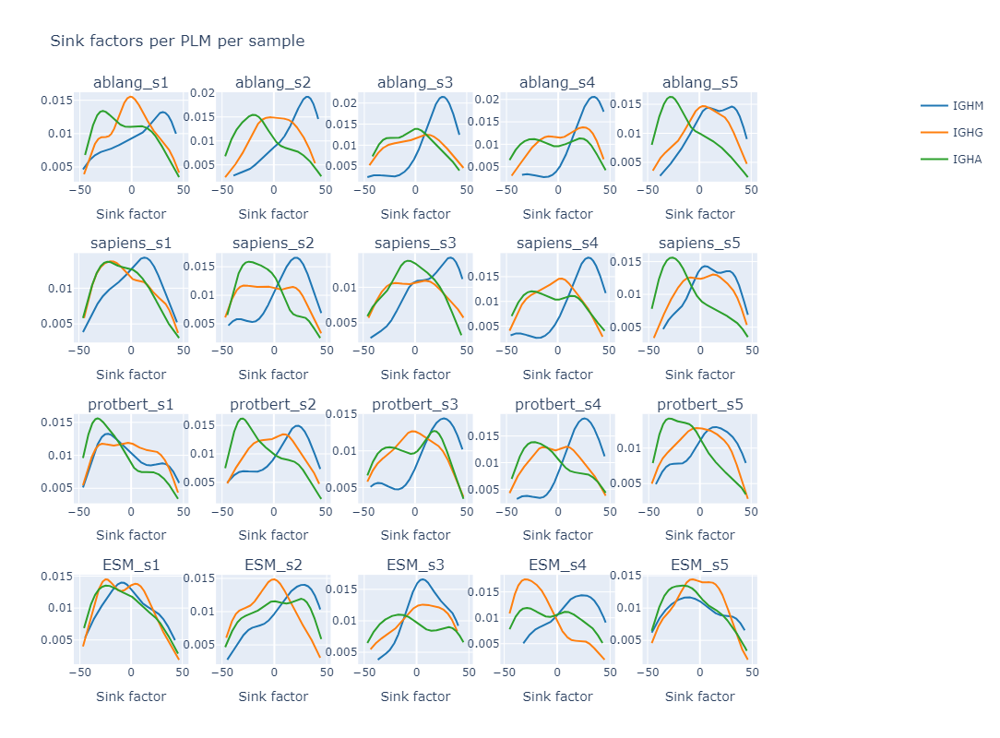

In [74]:
import plotly.express as px
import plotly.figure_factory as ff
from plotly.subplots import make_subplots
import plotly.graph_objects as go

cols = len(metadata["sample_id"].unique())
rows = len(model_names)
main_fig = make_subplots(rows,cols, subplot_titles=[" "] * rows * cols)

for i,sample in enumerate(metadata["sample_id"].unique()):

    for k, model in enumerate(model_names):

        output_table_subset = output_table.loc[(output_table["sample_id"] == sample) & (output_table["model"] == model),:]

    
        x1 = output_table_subset.loc[output_table["isotype"] == "IGHM","sink_factor"]
        x2 = output_table_subset.loc[output_table["isotype"] == "IGHG","sink_factor"]
        x3 = output_table_subset.loc[output_table["isotype"] == "IGHA","sink_factor"]

        if x1.shape[0] == 0 or x2.shape[0] == 0 or x3.shape[0] == 0:
            print(f"{sample}_{model}")
            continue
        
        fig = ff.create_distplot([x1,x2,x3], group_labels = ["IGHM","IGHG","IGHA"],show_hist=False, bin_size=2)
    
        if i >= 1 or k >=1:
            for j in range(3):
                fig.data[j]["showlegend"] = False
        
        # fig.update_layout(height = 1000, xaxis_title="Sink Factor")
        # fig.update_traces(textfont_size=10, cliponaxis=False)
        
        main_fig.add_traces(fig.data, rows=k+1, cols=i+1)
        main_fig.update_xaxes(title_text="Sink factor", row=k+1, col=i+1)
        main_fig.layout.annotations[k*cols + i].update(text=f"{model}_{sample}")


main_fig.update_layout(height = rows * 200, width = cols * 200, title_text="Sink factors per PLM per sample")
main_fig.show()

#### Velocity vs change in SHM_count

In [75]:
from scipy.sparse import coo_matrix
output_table = []

model = "ESM"
group = "VDJ_vgene"

for model in ["ESM"]:
    for sub_group in list(current_model[model].keys()):
        
        metadata = current_model[model][sub_group].obs
        velocity_graph = current_model[model][sub_group].uns["velocity_graph"]
        velocity_graph_neg = current_model[model][sub_group].uns["velocity_graph_neg"] 

        coo_pos = coo_matrix(velocity_graph.toarray())
        coo_pos = list(zip(coo_pos.row, coo_pos.col, coo_pos.data))
        coo_pos = pd.DataFrame(coo_pos, columns=["row","col","val"])

        coo_neg = coo_matrix(velocity_graph_neg.toarray())
        coo_neg = list(zip(coo_neg.row, coo_neg.col, coo_neg.data))
        coo_neg = pd.DataFrame(coo_neg, columns=["row","col","val"])

        for row in range(coo_pos.shape[0]):
                i = coo_pos["row"][row]
                j = coo_pos["col"][row]
                val = coo_pos["val"][row]
                if velocity_graph[i,j] != 0:
                    SHM_diff = metadata["SHM_count"][j] - metadata["SHM_count"][i]
                    if SHM_diff != 0:
                        output_table.append({"model":model,f"{group}":sub_group,"evo_velocity":val,"SHM_diff":SHM_diff})

        # for row in range(coo_neg.shape[0]):
        #         i = coo_neg["row"][row]
        #         j = coo_neg["col"][row]
        #         val = coo_neg["val"][row]
        #         if velocity_graph_neg[i,j] != 0:
        #             SHM_diff_rev = metadata["SHM_count"][i] - metadata["SHM_count"][j]
        #             output_table.append({"model":model,f"{group}":group,"evo_velocity":-val,"SHM_diff":SHM_diff_rev})
        
output_table = pd.DataFrame(output_table).drop_duplicates().reset_index(drop=True) 

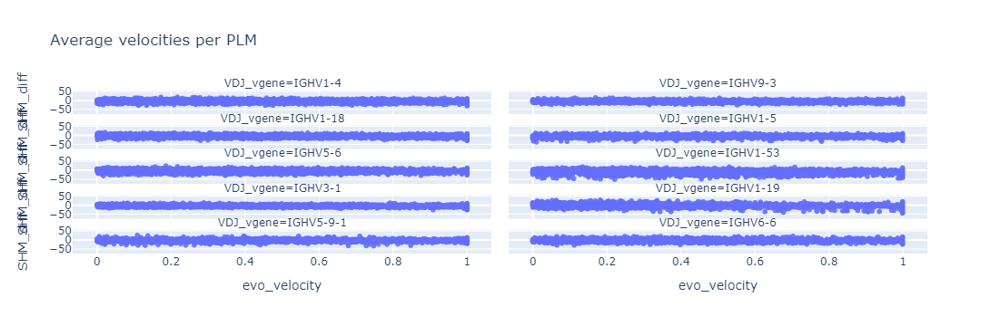

In [76]:
import plotly.express as px

fig = px.scatter(
    data_frame = output_table,
    facet_col = "VDJ_vgene",
    facet_col_wrap = 2,
    x = "evo_velocity",
    y = "SHM_diff",
    opacity = 0.9,
    orientation = "v",
    title='Average velocities per PLM',
)

fig.update_layout(height = 1000)

fig.show()

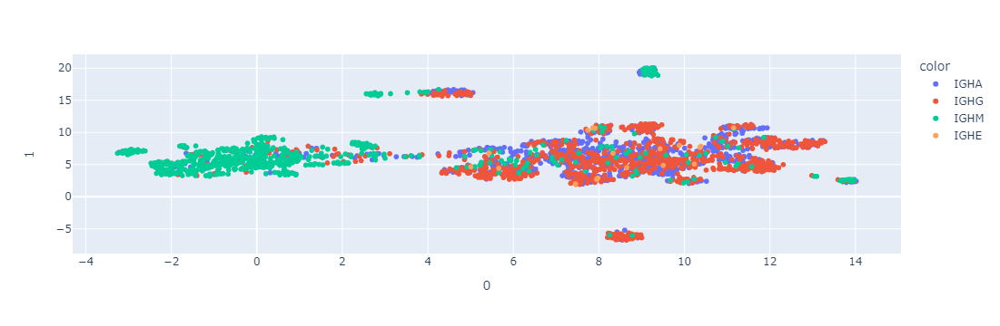

In [44]:
px.scatter(pd.DataFrame(current_model["ablang"]["IGHV1"].obsm["X_umap"]), x = 0, y = 1, color = current_model["ablang"]["IGHV1"].obs["isotype"]) 

#### Shared Nearest Neighbours

In [111]:
len(current_model["ablang"]["IGHV1"].obs["seq"].unique())

2701

In [115]:
(current_model["ablang"]["IGHV1"].obs["seq"] == current_model["ESM"]["IGHV1"].obs["seq"]).sum()

2701

In [78]:
from scipy.sparse import coo_matrix

output_table = []

model_pairs = [("ESM","protbert"),("ESM","sapiens"),("sapiens","protbert"),("ESM","ablang"),("sapiens","ablang"),("protbert","ablang")]
sub_group = "IGHV1-4"

for model_pair in model_pairs:

    model_1 = model_pair[0]
    model_2 = model_pair[1]
    
    n_sequences = len(current_model[model_1][sub_group].obs["seq"])
    
    metadata_1 = current_model[model_1][sub_group].obs
    nn_graph_1 = current_model[model_1][sub_group].uns["neighbors"]["indices"]
    
    metadata_2 = current_model[model_2][sub_group].obs
    nn_graph_2 = current_model[model_2][sub_group].uns["neighbors"]["indices"]

    for i in range(n_sequences):
        
        shared_nn = len(list(set(nn_graph_1[i,:]).intersection(set(nn_graph_2[i,:]))))
        output_table.append({"model_pair":f"{model_1}_{model_2}", f"{group}":sub_group, "shared_nn":shared_nn})

output_table = pd.DataFrame(output_table)

In [79]:
output_table

,model_pair,VDJ_vgene,shared_nn
0,ESM_protbert,IGHV1-4,30
1,ESM_protbert,IGHV1-4,36
2,ESM_protbert,IGHV1-4,19
3,ESM_protbert,IGHV1-4,30
4,ESM_protbert,IGHV1-4,31
...,...,...,...
1309,protbert_ablang,IGHV1-4,27
1310,protbert_ablang,IGHV1-4,28
1311,protbert_ablang,IGHV1-4,20
1312,protbert_ablang,IGHV1-4,27


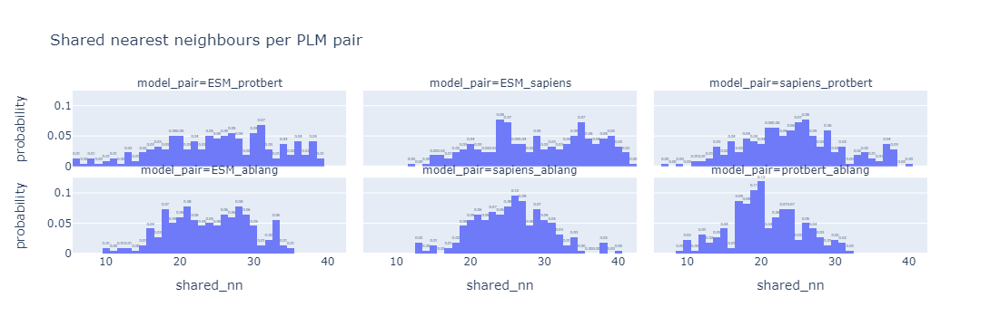

In [80]:
fig = px.histogram(
    data_frame = output_table,
    facet_col = "model_pair",
    facet_col_wrap = 3,
    histnorm="probability",
    x = "shared_nn",
    opacity = 0.9,
    orientation = "v",
    barmode = 'group',
    title='Shared nearest neighbours per PLM pair',
    text_auto="0.2f"
)

fig.update_layout(height = 500)
fig.update_traces(textfont_size=10, textangle=0, textposition="outside", cliponaxis=False)

fig.show()

#### Average Velocity per Sequence comparison between PLMs

In [82]:
from scipy.sparse import coo_matrix

output_table = []

model_pairs = [("ESM","protbert"),("ESM","sapiens"),("sapiens","protbert"),("ESM","ablang"),("sapiens","ablang"),("protbert","ablang")]
sub_group = "IGHV1-4"

for model_pair in model_pairs:

    model_1 = model_pair[0]
    model_2 = model_pair[1]
    
    n_sequences = len(current_model[model_1][sub_group].obs["seq"])
    
    metadata_1 = current_model[model_1][sub_group].obs
    velocity_graph_1 = current_model[model_1][sub_group].uns["velocity_graph"]
    velocity_graph_neg_1 = current_model[model_1][sub_group].uns["velocity_graph_neg"]
    
    metadata_2 = current_model[model_2][sub_group].obs
    velocity_graph_2 = current_model[model_2][sub_group].uns["velocity_graph"]
    velocity_graph_neg_2 = current_model[model_2][sub_group].uns["velocity_graph_neg"]

    for i in range(n_sequences):
        
        velo_sum_1 = velocity_graph_1[i, :].sum() + velocity_graph_neg_1[i,].sum()
        non_zero_velos_1 = (velocity_graph_1[i, :] != 0).sum() + (velocity_graph_neg_1[i,:] != 0).sum()
        if non_zero_velos_1 > 0:
            average_velo_1 = velo_sum_1/non_zero_velos_1
        else:
            average_velo_1 = 0

        velo_sum_2 = velocity_graph_2[i, :].sum() + velocity_graph_neg_2[i,].sum()
        non_zero_velos_2 = (velocity_graph_2[i, :] != 0).sum() + (velocity_graph_neg_2[i,:] != 0).sum()
        if non_zero_velos_2 > 0:
            average_velo_2 = velo_sum_2/non_zero_velos_2
        else:
            average_velo_2 = 0
            
        output_table.append({"model_pair":f"{model_1}_{model_2}", f"{group}":sub_group, 
                            "isotype":metadata_1["isotype"][i], "average_velocity_1":average_velo_1, "average_velocity_2":average_velo_2})

    output_table = pd.DataFrame(output_table)
    
    if "rank_average_velocity_1" not in output_table.columns: 
        output_table["rank_average_velocity_1"] = list(output_table["average_velocity_1"].rank(ascending = False))
        output_table["rank_average_velocity_2"] = list(output_table["average_velocity_2"].rank(ascending = False))
    else:
        select_model_pair = output_table["model_pair"] == f"{model_pair[0]}_{model_pair[1]}"
        output_table.loc[select_model_pair,"rank_average_velocity_1"] = list(output_table.loc[select_model_pair,"average_velocity_1"].rank(ascending = False))
        output_table.loc[select_model_pair,"rank_average_velocity_2"] = list(output_table.loc[select_model_pair,"average_velocity_2"].rank(ascending = False))

    output_table = output_table.to_dict(orient="records")

output_table = pd.DataFrame(output_table)

In [83]:
output_table

,model_pair,VDJ_vgene,isotype,average_velocity_1,average_velocity_2,rank_average_velocity_1,rank_average_velocity_2
0,ESM_protbert,IGHV1-4,IGHA,0.609965,0.172760,21.0,56.0
1,ESM_protbert,IGHV1-4,IGHG,0.092363,0.119167,105.0,72.0
2,ESM_protbert,IGHV1-4,IGHA,0.119186,0.325894,95.0,16.0
3,ESM_protbert,IGHV1-4,IGHM,0.455014,0.003575,37.0,124.0
4,ESM_protbert,IGHV1-4,IGHM,0.775191,0.177849,7.0,51.0
...,...,...,...,...,...,...,...
1309,protbert_ablang,IGHV1-4,IGHG,0.013048,0.165970,118.0,77.0
1310,protbert_ablang,IGHV1-4,IGHA,-0.089424,-0.367802,153.0,171.0
1311,protbert_ablang,IGHV1-4,IGHA,0.084984,0.180433,81.0,76.0
1312,protbert_ablang,IGHV1-4,IGHG,-0.136553,-0.617845,172.0,202.0


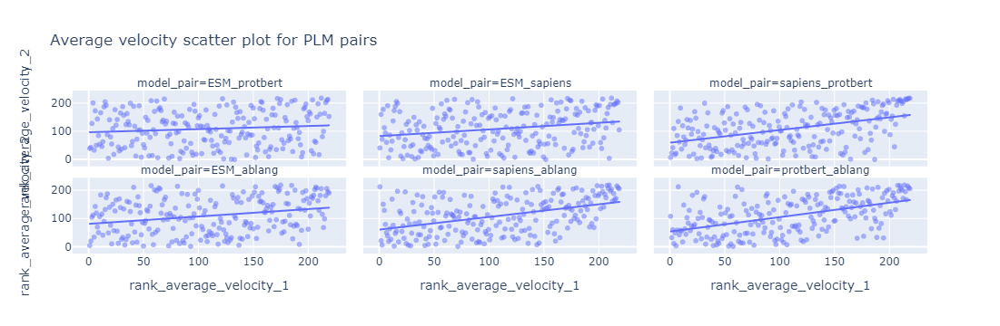

In [85]:
import plotly.express as px

fig = px.scatter(
    data_frame = output_table,
    facet_col = "model_pair",
    facet_col_wrap = 3,
    x = "rank_average_velocity_1",
    y = "rank_average_velocity_2",
    trendline="ols",
    # color="isotype",
    # trendline_color_override="red",
    opacity = 0.5,
    orientation = "v",
    title='Average velocity scatter plot for PLM pairs',
)

fig.update_layout(height = 500)

fig.show()